---
title: Whole transcriptome analysis of *Arabidopsis thaliana*
---

# Introduction 

In this practical, based on a [galaxy training](https://training.galaxyproject.org/training-material/topics/transcriptomics/tutorials/mirna-target-finder/tutorial.html#whole-transcriptome-analysis-of-arabidopsis-thaliana) built on data from the research of [Park *et al*. 2020](10.1007/s13258-020-00964-2), we aim to explore the interplay between brassinosteroids and the miRNA-gene silencing pathway, considered one of the most versatile regulatory mechanisms in response to stressful situations in plants.

We will explore gold standard practices for Differential Expression Analysis from quality control of reads to identification of putative regulatory miRNAs. As yesterday, we begin by preparing the environment for the analysis by running the following three cells. 

If the third cell prompts you to update any package, please input "no (n)" to avoid extending the waiting time more than necessary. 

In [230]:
%%bash
mamba install -y -q -c bioconda mirdeep2 targetfinder

pip install -q biopython

#Check if the conda environment exists
if conda env list | grep -q salmon; then
    echo "Conda environment salmon exists."
else
    echo "Conda environment salmon does not exist. Creating it now..."
    mamba create -y -q -n salmon -c bioconda salmon && echo "salmon install done"
fi
cpan -fi Compress::Zlib > cpan.log 2> cpan.err 


Conda environment salmon exists.


In [231]:
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [228]:
%%R
if (!requireNamespace("BiocManager", quietly = TRUE))
    suppressMessages(install.packages("BiocManager"))
suppressMessages(BiocManager::install(c("DESeq2", "apeglm")))


Update all/some/none? [a/s/n]: 

 n


## Retrieve RNAseq data

The following cell contains bash code that organizes and downloads RNA sequencing data files into designated directories. Here's a breakdown of the operations:

1. **Create directories**: 
   - It ensures the main directory `RNASeq_data` and subdirectories `miRNA` and `mRNA` exist. If they don't, it creates them.

2. **Define data files**: 
   - A list of file information (ID, category, URL) is defined in the `files` array.

3. **Download files**:
   - For each entry in the `files` array:
     - It reads the `srr_id` (file ID), `category` (miRNA or mRNA), and `url` (file download link).
     - If the category contains "miRNA", it downloads the file into the `RNASeq_data/miRNA` directory.
     - Otherwise, it downloads the file into the `RNASeq_data/mRNA` directory.


In [18]:
%%bash
# Create the main directory if it doesn't exist
mkdir -p RNASeq_data
mkdir -p RNASeq_data/miRNA
mkdir -p RNASeq_data/mRNA

files=(
    "SRR11611349 Control_miRNA https://zenodo.org/record/4710649/files/SRR11611349_MIRNASEQ_CTL.fastqsanger.gz"
    "SRR11611350 Control_miRNA https://zenodo.org/record/4710649/files/SRR11611350_MIRNASEQ_CTL.fastqsanger.gz"
    "SRR11611351 Control_miRNA https://zenodo.org/record/4710649/files/SRR11611351.MIRNASEQ_CTLfastqsanger.gz"
    "SRR11611352 BR_treated_miRNA https://zenodo.org/record/4710649/files/SRR11611352_MIRNASEQ_BL.fastqsanger.gz"
    "SRR11611353 BR_treated_miRNA https://zenodo.org/record/4710649/files/SRR11611353_MIRNASEQ_BL.fastqsanger.gz"
    "SRR11611354 BR_treated_miRNA https://zenodo.org/record/4710649/files/SRR11611354_MIRNASEQ_BL.fastqsanger.gz"
    "SRR1019436 Control_mRNA https://zenodo.org/record/4710649/files/SRR1019436_RNASEQ_CTL.fastqsanger.gz"
    "SRR1019437 Control_mRNA https://zenodo.org/record/4710649/files/SRR1019437_RNASEQ_CTL.fastqsanger.gz"
    "SRR1019438 BR_treated_mRNA https://zenodo.org/record/4710649/files/SRR1019438_RNASEQ_BL.fastqsanger.gz"
    "SRR1019439 BR_treated_mRNA https://zenodo.org/record/4710649/files/SRR1019439_RNASEQ_BL.fastqsanger.gz"
)

# Download each file into the appropriate directory
for entry in "${files[@]}"; do
    IFS=' ' read -r srr_id category url <<< "$entry"
    if [[ $category == *"miRNA"* ]]; then
        echo "Downloading $srr_id (miRNA) from $url"
        wget -q -O RNASeq_data/miRNA/${srr_id}.fastqsanger.gz $url
    else
        echo "Downloading $srr_id (mRNA) from $url"
        wget -q -O RNASeq_data/mRNA/${srr_id}.fastqsanger.gz $url
    fi
done

echo "Download completed. All files are saved in the RNASeq_data directory with separate folders for miRNA and mRNA."



Download completed. All files are saved in the RNASeq_data directory with separate folders for miRNA and mRNA.


## Retrieve reference data
We will use several reference datasets for our analyses, including:

1. A reference transcriptome to map the mRNA reads for gene expression quantification.
2. A collection of miRNAs in their mature forms.
3. The corresponding stem-loop structures and inactive portions (aka star miRNAs).

The following cell downloads the required data similarly to the previous one for reads. 

In [8]:
%%bash

# Create the Genomic_Annotations directory if it doesn't exist
mkdir -p Reference_datasets

# List of URLs and corresponding filenames
declare -A files
files=(
    ["annotation_AtRTD2.gtf.gz"]="https://zenodo.org/record/4710649/files/annotation_AtRTD2_19April2016.gtf.gz"
    ["transcriptome.fasta.gz"]="https://zenodo.org/record/4710649/files/transcriptome_AtRTD2_12April2016.fasta.gz"
    ["star_miRNA_seq.fasta"]="https://zenodo.org/record/4710649/files/star_miRNA_seq.fasta"
    ["mature_miRNA_AT.fasta"]="https://zenodo.org/record/4710649/files/mature_miRNA_AT.fasta"
    ["miRNA_stem-loop_seq.fasta"]="https://zenodo.org/record/4710649/files/miRNA_stem-loop_seq.fasta"
)

# Download each file
for filename in "${!files[@]}"; do
    url="${files[$filename]}"
    echo "Downloading $filename from $url"
    wget -q -O Reference_datasets/${filename} $url
done

echo "Download completed. All files are saved in the Reference_datasets directory."



Download completed. All files are saved in the Reference_datasets directory.


# miRNA data analysis

## Quality control of sequencing reads

Additionally to sequence miscalls, adapter contamination can interfere with our analyses by increasing the number of unaligned reads, as adapter sequences are synthetic and do not match the genomic sequence. Therefore, sequence quality control is an essential first step in our analysis, and we will use FastQC and MultiQC to do so.

In [19]:
%%bash
mkdir -p RNASeq_data/miRNA/FastQC
fastqc -t 4 -o RNASeq_data/miRNA/FastQC RNASeq_data/miRNA/*.fastqsanger.gz 2> RNAseq_miRNA_fastqc.log
multiqc -o RNASeq_data/miRNA/FastQC RNASeq_data/miRNA/FastQC

application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
Analysis complete for SRR11611349.fastqsanger.gz
Analysis complete for SRR11611350.fastqsanger.gz
Analysis complete for SRR11611351.fastqsanger.gz
Analysis complete for SRR11611352.fastqsanger.gz
Analysis complete for SRR11611354.fastqsanger.gz
Analysis complete for SRR11611353.fastqsanger.gz



  /// ]8;id=964835;https://multiqc.info\MultiQC]8;;\ 🔍 | v1.21

|           multiqc | MultiQC Version v1.22.1 now available!
|           multiqc | Search path : /home/jovyan/work/Esercitazioni/RNASeq_data/miRNA/FastQC
|         searching | ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 12/12  0m  
|            fastqc | Found 6 reports
|           multiqc | Report      : RNASeq_data/miRNA/FastQC/multiqc_report.html
|           multiqc | Data        : RNASeq_data/miRNA/FastQC/multiqc_data
|           multiqc | MultiQC complete


We can now have a look at the results contained in the multiqc report, we will use them to check which kind of filtering is needed. 

In particular let's focus on the **Overrepresented Sequences** and **Adapter Content** sections. Particularly remarkable is the content of adapters, which are up to 80% of the reads in some samples. Given the abundance of adapters, one would expect that if we eliminate this source of contamination, the rest of the parameters would show a noticeable improvement.

## Trimming of miRNA reads

To remove the adapters we will employ **fastp**, which is going to ensure quick and accurate trimming. Fastp is usually able to identify adapters automatically, but this function does not perform well on very short reads, therefore we will provide the right adapters to the script manually. 

```
>adapter_3
TGGAATTCTCGGGTGCCAAGG
>adapter_5
GTTCAGAGTTCTACAGTCCGACGATC
```

The script in the following cell processes miRNA read files to remove adapter sequences and generate quality reports using `fastp`. It:

1. Sets input and output directories.
2. Defines Illumina adapter sequences.
3. Creates the output directory if it doesn't exist.
4. Loops through all `.fastqsanger.gz` files in the input directory, processes each with `fastp`, and saves the cleaned output along with HTML and JSON reports in the output directory.

This will produce a fair amount of output, but it's useful for monitoring the filtering effects

In [42]:
%%bash

# Directory containing miRNA read files
input_dir="RNASeq_data/miRNA"
output_dir="RNASeq_data/miRNA/processed"

# Create the output directory if it doesn't exist
mkdir -p $output_dir

# Define the Illumina small RNA adapter sequences
adapter_3="TGGAATTCTCGGGTGCCAAGG"
adapter_5="GTTCAGAGTTCTACAGTCCGACGATC"

# Loop through all fastqsanger.gz files in the input directory
for input_file in $input_dir/*.fastqsanger.gz; do
    # Extract the base name of the file (without the path and extension)
    base_name=$(basename $input_file .fastqsanger.gz)
    
    # Define the output file names
    output_file="${output_dir}/${base_name}_clean.fastq"
    html_report="${output_dir}/${base_name}_fastp.html"
    json_report="${output_dir}/${base_name}_fastp.json"
    
    # Run fastp with specified adapters
    echo "Processing $input_file with fastp"
    fastp -i $input_file -o $output_file \
          --adapter_sequence $adapter_3 \
          --adapter_sequence_r2 $adapter_5 \
          -h $html_report -j $json_report
    
    echo "Output: $output_file"
    echo "HTML report: $html_report"
    echo "JSON report: $json_report"
done

echo "fastp processing completed for all miRNA read files."

Processing RNASeq_data/miRNA/SRR11611349.fastqsanger.gz with fastp


Read1 before filtering:
total reads: 568994
total bases: 19914790
Q20 bases: 19752212(99.1836%)
Q30 bases: 19302405(96.925%)

Read1 after filtering:
total reads: 526225
total bases: 13692218
Q20 bases: 13596136(99.2983%)
Q30 bases: 13312505(97.2268%)

Filtering result:
reads passed filter: 526225
reads failed due to low quality: 1
reads failed due to too many N: 0
reads failed due to too short: 42768
reads with adapter trimmed: 411757
bases trimmed due to adapters: 5741509

Duplication rate (may be overestimated since this is SE data): 68.6974%

JSON report: RNASeq_data/miRNA/processed/SRR11611349_fastp.json
HTML report: RNASeq_data/miRNA/processed/SRR11611349_fastp.html

fastp -i RNASeq_data/miRNA/SRR11611349.fastqsanger.gz -o RNASeq_data/miRNA/processed/SRR11611349_clean.fastq --adapter_sequence TGGAATTCTCGGGTGCCAAGG --adapter_sequence_r2 GTTCAGAGTTCTACAGTCCGACGATC -h RNASeq_data/miRNA/processed/SRR11611349_fastp.html -j RNASeq_data/miRNA/processed/SRR11611349_fastp.json 
fastp v0.23

Output: RNASeq_data/miRNA/processed/SRR11611349_clean.fastq
HTML report: RNASeq_data/miRNA/processed/SRR11611349_fastp.html
JSON report: RNASeq_data/miRNA/processed/SRR11611349_fastp.json
Processing RNASeq_data/miRNA/SRR11611350.fastqsanger.gz with fastp


Read1 before filtering:
total reads: 475880
total bases: 16655800
Q20 bases: 16474173(98.9095%)
Q30 bases: 16016446(96.1614%)

Read1 after filtering:
total reads: 351276
total bases: 7710973
Q20 bases: 7659670(99.3347%)
Q30 bases: 7503389(97.3079%)

Filtering result:
reads passed filter: 351276
reads failed due to low quality: 6
reads failed due to too many N: 0
reads failed due to too short: 124598
reads with adapter trimmed: 446624
bases trimmed due to adapters: 7622162

Duplication rate (may be overestimated since this is SE data): 69.1773%

JSON report: RNASeq_data/miRNA/processed/SRR11611350_fastp.json
HTML report: RNASeq_data/miRNA/processed/SRR11611350_fastp.html

fastp -i RNASeq_data/miRNA/SRR11611350.fastqsanger.gz -o RNASeq_data/miRNA/processed/SRR11611350_clean.fastq --adapter_sequence TGGAATTCTCGGGTGCCAAGG --adapter_sequence_r2 GTTCAGAGTTCTACAGTCCGACGATC -h RNASeq_data/miRNA/processed/SRR11611350_fastp.html -j RNASeq_data/miRNA/processed/SRR11611350_fastp.json 
fastp v0.23.

Output: RNASeq_data/miRNA/processed/SRR11611350_clean.fastq
HTML report: RNASeq_data/miRNA/processed/SRR11611350_fastp.html
JSON report: RNASeq_data/miRNA/processed/SRR11611350_fastp.json
Processing RNASeq_data/miRNA/SRR11611351.fastqsanger.gz with fastp


Read1 before filtering:
total reads: 518426
total bases: 18144910
Q20 bases: 17961202(98.9876%)
Q30 bases: 17495272(96.4197%)

Read1 after filtering:
total reads: 417129
total bases: 9936339
Q20 bases: 9870372(99.3361%)
Q30 bases: 9672232(97.342%)

Filtering result:
reads passed filter: 417129
reads failed due to low quality: 6
reads failed due to too many N: 0
reads failed due to too short: 101291
reads with adapter trimmed: 443143
bases trimmed due to adapters: 7143650

Duplication rate (may be overestimated since this is SE data): 68.6312%

JSON report: RNASeq_data/miRNA/processed/SRR11611351_fastp.json
HTML report: RNASeq_data/miRNA/processed/SRR11611351_fastp.html

fastp -i RNASeq_data/miRNA/SRR11611351.fastqsanger.gz -o RNASeq_data/miRNA/processed/SRR11611351_clean.fastq --adapter_sequence TGGAATTCTCGGGTGCCAAGG --adapter_sequence_r2 GTTCAGAGTTCTACAGTCCGACGATC -h RNASeq_data/miRNA/processed/SRR11611351_fastp.html -j RNASeq_data/miRNA/processed/SRR11611351_fastp.json 
fastp v0.23.4

Output: RNASeq_data/miRNA/processed/SRR11611351_clean.fastq
HTML report: RNASeq_data/miRNA/processed/SRR11611351_fastp.html
JSON report: RNASeq_data/miRNA/processed/SRR11611351_fastp.json
Processing RNASeq_data/miRNA/SRR11611352.fastqsanger.gz with fastp


Read1 before filtering:
total reads: 528457
total bases: 18495995
Q20 bases: 18321935(99.0589%)
Q30 bases: 17857866(96.5499%)

Read1 after filtering:
total reads: 477604
total bases: 12578508
Q20 bases: 12488104(99.2813%)
Q30 bases: 12217640(97.1311%)

Filtering result:
reads passed filter: 477604
reads failed due to low quality: 7
reads failed due to too many N: 0
reads failed due to too short: 50846
reads with adapter trimmed: 373646
bases trimmed due to adapters: 5373229

Duplication rate (may be overestimated since this is SE data): 69.2348%

JSON report: RNASeq_data/miRNA/processed/SRR11611352_fastp.json
HTML report: RNASeq_data/miRNA/processed/SRR11611352_fastp.html

fastp -i RNASeq_data/miRNA/SRR11611352.fastqsanger.gz -o RNASeq_data/miRNA/processed/SRR11611352_clean.fastq --adapter_sequence TGGAATTCTCGGGTGCCAAGG --adapter_sequence_r2 GTTCAGAGTTCTACAGTCCGACGATC -h RNASeq_data/miRNA/processed/SRR11611352_fastp.html -j RNASeq_data/miRNA/processed/SRR11611352_fastp.json 
fastp v0.2

Output: RNASeq_data/miRNA/processed/SRR11611352_clean.fastq
HTML report: RNASeq_data/miRNA/processed/SRR11611352_fastp.html
JSON report: RNASeq_data/miRNA/processed/SRR11611352_fastp.json
Processing RNASeq_data/miRNA/SRR11611353.fastqsanger.gz with fastp


Read1 before filtering:
total reads: 584773
total bases: 20467055
Q20 bases: 20257757(98.9774%)
Q30 bases: 19723774(96.3684%)

Read1 after filtering:
total reads: 466392
total bases: 11112111
Q20 bases: 11037019(99.3242%)
Q30 bases: 10814938(97.3257%)

Filtering result:
reads passed filter: 466392
reads failed due to low quality: 5
reads failed due to too many N: 0
reads failed due to too short: 118376
reads with adapter trimmed: 496187
bases trimmed due to adapters: 8091875

Duplication rate (may be overestimated since this is SE data): 70.0523%

JSON report: RNASeq_data/miRNA/processed/SRR11611353_fastp.json
HTML report: RNASeq_data/miRNA/processed/SRR11611353_fastp.html

fastp -i RNASeq_data/miRNA/SRR11611353.fastqsanger.gz -o RNASeq_data/miRNA/processed/SRR11611353_clean.fastq --adapter_sequence TGGAATTCTCGGGTGCCAAGG --adapter_sequence_r2 GTTCAGAGTTCTACAGTCCGACGATC -h RNASeq_data/miRNA/processed/SRR11611353_fastp.html -j RNASeq_data/miRNA/processed/SRR11611353_fastp.json 
fastp v0.

Output: RNASeq_data/miRNA/processed/SRR11611353_clean.fastq
HTML report: RNASeq_data/miRNA/processed/SRR11611353_fastp.html
JSON report: RNASeq_data/miRNA/processed/SRR11611353_fastp.json
Processing RNASeq_data/miRNA/SRR11611354.fastqsanger.gz with fastp


Read1 before filtering:
total reads: 316111
total bases: 11063885
Q20 bases: 10967409(99.128%)
Q30 bases: 10694071(96.6575%)

Read1 after filtering:
total reads: 269944
total bases: 7044749
Q20 bases: 6993516(99.2727%)
Q30 bases: 6839655(97.0887%)

Filtering result:
reads passed filter: 269944
reads failed due to low quality: 2
reads failed due to too many N: 0
reads failed due to too short: 46165
reads with adapter trimmed: 231942
bases trimmed due to adapters: 3571197

Duplication rate (may be overestimated since this is SE data): 66.9186%

JSON report: RNASeq_data/miRNA/processed/SRR11611354_fastp.json
HTML report: RNASeq_data/miRNA/processed/SRR11611354_fastp.html

fastp -i RNASeq_data/miRNA/SRR11611354.fastqsanger.gz -o RNASeq_data/miRNA/processed/SRR11611354_clean.fastq --adapter_sequence TGGAATTCTCGGGTGCCAAGG --adapter_sequence_r2 GTTCAGAGTTCTACAGTCCGACGATC -h RNASeq_data/miRNA/processed/SRR11611354_fastp.html -j RNASeq_data/miRNA/processed/SRR11611354_fastp.json 
fastp v0.23.4,

Output: RNASeq_data/miRNA/processed/SRR11611354_clean.fastq
HTML report: RNASeq_data/miRNA/processed/SRR11611354_fastp.html
JSON report: RNASeq_data/miRNA/processed/SRR11611354_fastp.json
fastp processing completed for all miRNA read files.


In [26]:
%%bash
mkdir -p RNASeq_data/miRNA/processed/FastQC
fastqc -t 4 -o RNASeq_data/miRNA/processed/FastQC RNASeq_data/miRNA/processed/*.fastqsanger.gz 2> RNAseq_miRNA_fastqc.log
multiqc -o RNASeq_data/miRNA/processed/FastQC RNASeq_data/miRNA/processed/FastQC

application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
Analysis complete for SRR11611350_clean.fastqsanger.gz
Analysis complete for SRR11611349_clean.fastqsanger.gz
Analysis complete for SRR11611351_clean.fastqsanger.gz
Analysis complete for SRR11611352_clean.fastqsanger.gz
Analysis complete for SRR11611354_clean.fastqsanger.gz
Analysis complete for SRR11611353_clean.fastqsanger.gz



  /// ]8;id=566225;https://multiqc.info\MultiQC]8;;\ 🔍 | v1.21

|           multiqc | MultiQC Version v1.22.1 now available!
|           multiqc | Search path : /home/jovyan/work/Esercitazioni/RNASeq_data/miRNA/processed/FastQC
|         searching | ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 12/12  0m  
|            fastqc | Found 6 reports
|           multiqc | Report      : RNASeq_data/miRNA/processed/FastQC/multiqc_report.html
|           multiqc | Data        : RNASeq_data/miRNA/processed/FastQC/multiqc_data
|           multiqc | MultiQC complete


Now let's run the quality control on the processed reads to verify its effects and let's compare the results with the previous run.

The adapters are now gone. 

## miRNA expression analysis

Quantification of miRNAs requires to use two different tools:

- The MiRDeep2 Mapper (`mapper.pl`) tool for preprocessing the reads.
- The MiRDeep2 Quantifier (`quantifier.pl`) tool for mapping the deep sequencing reads to predefined miRNA precursors and determining the expression of the corresponding miRNAs. It is carried out in two steps: firstly, the predefined mature miRNA sequences are mapped to the predefined precursors (optionally, predefined star sequences can be mapped to the precursors too). And second, the deep sequencing reads are mapped to the precursors.

The following cell runs both tools on the processed reads in a loop. 


In [64]:
%%bash
#!/bin/bash

# Set paths
REFERENCE_DIR="Reference_datasets"
INPUT_DIR="RNASeq_data/miRNA/processed"
OUTPUT_DIR="${INPUT_DIR}/mirdeep_mapping"
QUANTIFIER_OUTPUT_DIR="${OUTPUT_DIR}/quantifier"

# Create necessary directories
mkdir -p "$OUTPUT_DIR"
mkdir -p "$QUANTIFIER_OUTPUT_DIR"

# Loop through all fastq files in the input directory
for FILE in "$INPUT_DIR"/*.fastq; do
  BASENAME=$(basename "$FILE" .fastq)
  
  # Run mapper.pl
  mapper.pl "$FILE" -e -h -j -i -m -s "$OUTPUT_DIR/${BASENAME}.mirdeep" -v -n

  # Run quantifier.pl
  quantifier.pl -p "$REFERENCE_DIR/miRNA_stem-loop_seq.fasta" \
                                -m "$REFERENCE_DIR/mature_miRNA_AT.fasta" \
                                -r "$OUTPUT_DIR/${BASENAME}.mirdeep" \
                                -s "$REFERENCE_DIR/star_miRNA_seq.fasta" \
                                -y "${BASENAME}" > "$QUANTIFIER_OUTPUT_DIR/${BASENAME}_quantifier.log" 2> "mirdeep.err"
echo "$FILE analysis complete"
done



parsing fastq to fasta format
converting rna to dna alphabet
discarding sequences with non-canonical letters
discarding short reads
collapsing reads
Log file for this run is in mapper_logs and called mapper.log_179577


RNASeq_data/miRNA/processed/SRR11611349_clean.fastq analysis complete



parsing fastq to fasta format
converting rna to dna alphabet
discarding sequences with non-canonical letters
discarding short reads
collapsing reads
Log file for this run is in mapper_logs and called mapper.log_180094


RNASeq_data/miRNA/processed/SRR11611350_clean.fastq analysis complete



parsing fastq to fasta format
converting rna to dna alphabet
discarding sequences with non-canonical letters
discarding short reads
collapsing reads
Log file for this run is in mapper_logs and called mapper.log_180595


RNASeq_data/miRNA/processed/SRR11611351_clean.fastq analysis complete



parsing fastq to fasta format
converting rna to dna alphabet
discarding sequences with non-canonical letters
discarding short reads
collapsing reads
Log file for this run is in mapper_logs and called mapper.log_181413


RNASeq_data/miRNA/processed/SRR11611352_clean.fastq analysis complete



parsing fastq to fasta format
converting rna to dna alphabet
discarding sequences with non-canonical letters
discarding short reads
collapsing reads
Log file for this run is in mapper_logs and called mapper.log_182533


RNASeq_data/miRNA/processed/SRR11611353_clean.fastq analysis complete



parsing fastq to fasta format
converting rna to dna alphabet
discarding sequences with non-canonical letters
discarding short reads
collapsing reads
Log file for this run is in mapper_logs and called mapper.log_183665


RNASeq_data/miRNA/processed/SRR11611354_clean.fastq analysis complete


We now have six separate count files, and we need to merge them into a single count table so that we can perform differential expression analysis. We will use some overcomplicated python code for this task.

In [69]:
import pandas as pd
import glob

# Define the path pattern to find all miRNA_expressed.csv files
path_pattern = "expression_analyses/expression_analyses_*/miRNA_expressed.csv"

# Use glob to find all matching files
csv_files = glob.glob(path_pattern)

# Dictionary to hold DataFrames with sample names as keys
data_frames = {}

# Read each CSV file and store in the dictionary
for file in csv_files:
    sample_name = file.split('/')[-2]  # Extract sample name from the directory
    df = pd.read_csv(file, index_col=0, sep = "\t", usecols=[0,1])
    data_frames[sample_name] = df

# Merge all DataFrames using outer join
merged_df = pd.concat(data_frames.values(), axis=1, join='outer').fillna(0)

# Rename columns to include sample names
merged_df.columns = data_frames.keys()

# Save the merged DataFrame to a new CSV file
merged_df.to_csv("merged_miRNA_expressed.csv")

print(f"Merged {len(csv_files)} files into 'merged_miRNA_expressed.csv'")


Merged 6 files into 'merged_miRNA_expressed.csv'


## Differential Expression Analysis of miRNAs

One gold standard package for differential expression analysis is **DESeq2**, which is an R package. For this reason the next cells start with `%%R`, which will ensure the R interpreter can be used within this notebook. 

First we load the count table, create the grouping for samples using the filenames and scatter plot the first two components of PCA to evaluate the dominant directions of the highest variability in the data. We expect samples from the same condition to cluster together, clearly separated along the first principal component. 

In [ ]:
%%R
library(DESeq2)
library(readr)
library(ggplot2)
counts <- read.csv("merged_miRNA_expressed.csv", row.names = 1)
sample_names <- colnames(counts)
condition <- ifelse(grepl("49|50|51", sample_names), "control", "brassinolide")
coldata <- data.frame(row.names = sample_names, condition = factor(condition))
dds <- DESeqDataSetFromMatrix(countData = counts, colData = coldata, design = ~ condition)
dds <- DESeq(dds)

rld <- rlog(dds, blind = TRUE)
pcaData <- plotPCA(rld, intgroup = "condition", returnData = TRUE)
percentVar <- round(100 * attr(pcaData, "percentVar"))

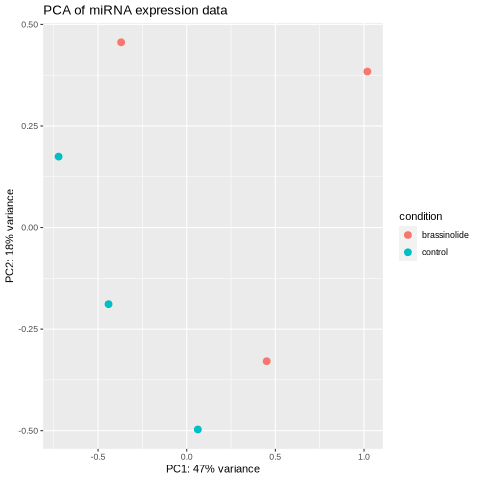

In [81]:
%%R
ggplot(pcaData, aes(PC1, PC2, color = condition)) +
  geom_point(size = 3) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  ggtitle("PCA of miRNA expression data")

As can be seen, the main axes account for only 47% and 19% of the total variation, and there is no clustering of samples from the same condition. This suggests that the effect of brassinosteroids on miRNA regulation is limited. Let's have a look to our results and see if any miRNAs statisfy the condition.

### Filtering of significant differentially expressed miRNAs

Next, we will identify genes that are significantly differentially expressed (DE) due to BR treatment by selecting those with an adjusted p-value of 0.05 or less. Simply put, cut-off value of 0.05 means that there is less than a 5% chance of a false positive result.

:::{note}Pvalue and adjustments
:class: dropdown
The p-value measures the probability that an observed difference occurred by random chance. A small p-value suggests a low chance of obtaining this data if no real difference existed. A p-value threshold of 0.05 indicates a 5% chance of a false positive result. The adjusted p-value (p-adj or q-value) accounts for the false discovery rate (FDR), which is crucial when analyzing thousands of variables from a small sample set.

Various methods exist to correct p-values to control for false positives in multiple testing scenarios. The Bonferroni correction is a stringent method that adjusts p-values by multiplying them by the number of tests, reducing the likelihood of type I errors but increasing type II errors. The Benjamini-Hochberg (BH) procedure is less conservative, controlling the false discovery rate (FDR) to balance sensitivity and specificity. Other methods include the Holm-Bonferroni and Benjamini-Yekutieli procedures, each offering different balances between false positive and false negative rates. These corrections ensure more reliable results when testing multiple hypotheses.
:::

In [80]:
%%R
res <- results(dds)

In [83]:
%%R
res[order(res$padj), ]

log2 fold change (MLE): condition control vs brassinolide 
Wald test p-value: condition control vs brassinolide 
DataFrame with 332 rows and 6 columns
              baseMean log2FoldChange     lfcSE      stat      pvalue      padj
             <numeric>      <numeric> <numeric> <numeric>   <numeric> <numeric>
Ath-miR167a*   432.718      0.5582294  0.153103 3.6461069 0.000266243 0.0742819
Ath-miR156a    181.823      0.0104218  0.170674 0.0610623 0.951309567 0.9757918
Ath-miR156b    182.585      0.0144899  0.170590 0.0849402 0.932308920 0.9757918
Ath-miR156c    181.823      0.0104218  0.170674 0.0610623 0.951309567 0.9757918
Ath-miR156d    181.823      0.0104218  0.170674 0.0610623 0.951309567 0.9757918
...                ...            ...       ...       ...         ...       ...
Ath-miRN146          0             NA        NA        NA          NA        NA
Ath-miRN148          0             NA        NA        NA          NA        NA
Ath-miRN149          0             NA        NA  

unfortunately this reduced dataset does not produce any significant result. We will download the results for the analysis of the full dataset in order to continue.

In [84]:
!wget -q https://zenodo.org/record/4663389/files/miRNA_DESeq2_results_complete_dataset.tabular

We can load this dataset into python to produce a couple of useful figures for visualizing differential expression analysis results, i.e, a **volcano plot** and a **MA plot**.

- **Volcano Plot** is a scatter plot that shows statistical significance (p-value) versus magnitude of change (fold change) to identify differentially expressed genes, with highly significant and large fold-change genes appearing as points farthest from the origin.
  
- **MA Plot** is a scatter plot that displays the log ratio (M, `log(fold_change)`) versus the mean average (A) of expression levels, highlighting differences between conditions, with differentially expressed genes typically visible as points deviating from the horizontal center line.

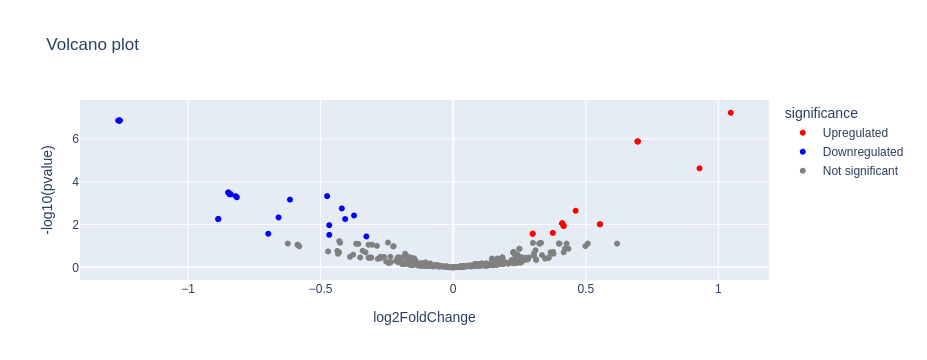

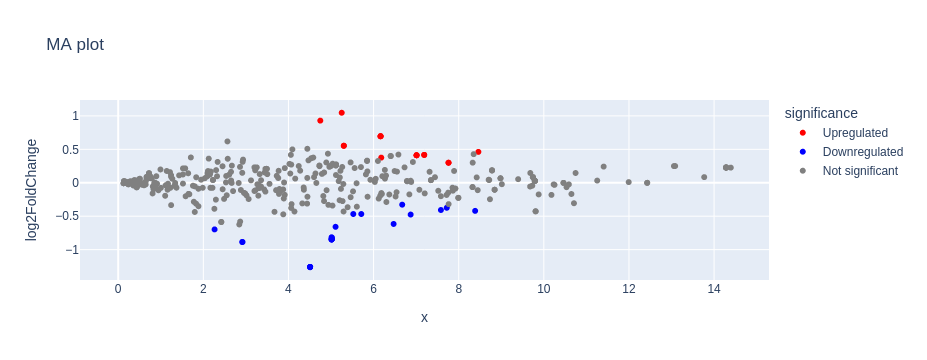

In [100]:
import pandas as pd
import plotly.express as px
import numpy as np
# Read the DESeq2 results
col_names = ["miRNA", "baseMean", "log2FoldChange", "lfcSE", "stat", "pvalue", "padj"]
df = pd.read_csv("miRNA_DESeq2_results_complete_dataset.tabular", names = col_names, sep = "\t")

# Add a column for significance
df['significance'] = 'Not significant'
df.loc[(df['log2FoldChange'] > 0) & (df['padj'] < 0.05), 'significance'] = 'Upregulated'
df.loc[(df['log2FoldChange'] < 0) & (df['padj'] < 0.05), 'significance'] = 'Downregulated'
df['-log10(pvalue)'] = -np.log10(df['padj'])

# Convert to plotly for interactivity
fig_volcano = px.scatter(
    df, x='log2FoldChange', y='-log10(pvalue)', color='significance',
    hover_data=['miRNA'], color_discrete_map={"Not significant": "grey", "Upregulated": "red", "Downregulated": "blue"},
    title="Volcano plot"
)
fig_ma = px.scatter(
    df, x=np.log(df['baseMean']+1), y='log2FoldChange', color='significance',
    hover_data=['miRNA'], color_discrete_map={"Not significant": "grey", "Upregulated": "red", "Downregulated": "blue"},
    title="MA plot"
)

# Show the plots
fig_volcano.show()
fig_ma.show()

## mRNA data analysis

Once the differential expression analysis of miRNAs has been carried out, the next stage is to analyze how mRNA expression is altered in response to brassinosteroids.

### Quality control of reads

We will perform this step exactly as we did for miRNAseq data. 

In [102]:
%%bash
mkdir -p RNASeq_data/mRNA/FastQC
fastqc -t 4 -o RNASeq_data/mRNA/FastQC RNASeq_data/mRNA/*.fastqsanger.gz 2> RNAseq_mRNA_fastqc.log
multiqc -o RNASeq_data/mRNA/FastQC RNASeq_data/mRNA/FastQC

application/gzip
application/gzip
application/gzip
application/gzip
Analysis complete for SRR1019436.fastqsanger.gz
Analysis complete for SRR1019437.fastqsanger.gz
Analysis complete for SRR1019438.fastqsanger.gz
Analysis complete for SRR1019439.fastqsanger.gz



  /// ]8;id=397964;https://multiqc.info\MultiQC]8;;\ 🔍 | v1.21

|           multiqc | MultiQC Version v1.22.1 now available!
|           multiqc | Search path : /home/jovyan/work/Esercitazioni/RNASeq_data/mRNA/FastQC
|         searching | ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 8/8  0/8  
|            fastqc | Found 4 reports
|           multiqc | Report      : RNASeq_data/mRNA/FastQC/multiqc_report.html
|           multiqc | Data        : RNASeq_data/mRNA/FastQC/multiqc_data
|           multiqc | MultiQC complete


### Trimming of RNAseq reads

Given the mapping algorithm we will use, trimming the adapters is not strictly required. The reason for this will be detailed later, but lets nevertheless remove that compositional bias we observe at the beginning of the reads and the few adapters using **fastp**.

In [103]:
%%bash

# Directory containing mRNA read files
input_dir="RNASeq_data/mRNA"
output_dir="RNASeq_data/mRNA/processed"

# Create the output directory if it doesn't exist
mkdir -p $output_dir


# Loop through all fastqsanger.gz files in the input directory
for input_file in $input_dir/*.fastqsanger.gz; do
    # Extract the base name of the file (without the path and extension)
    base_name=$(basename $input_file .fastqsanger.gz)
    
    # Define the output file names
    output_file="${output_dir}/${base_name}_clean.fastq"
    html_report="${output_dir}/${base_name}_fastp.html"
    json_report="${output_dir}/${base_name}_fastp.json"
    
    # Run fastp with specified adapters
    echo "Processing $input_file with fastp"
    fastp -i $input_file -o $output_file \
          -h $html_report -j $json_report -f 15
    
    echo "Output: $output_file"
    echo "HTML report: $html_report"
    echo "JSON report: $json_report"
done

echo "fastp processing completed for all mRNA read files."

Processing RNASeq_data/mRNA/SRR1019436.fastqsanger.gz with fastp


Detecting adapter sequence for read1...
>Illumina TruSeq Adapter Read 1
AGATCGGAAGAGCACACGTCTGAACTCCAGTCA

Read1 before filtering:
total reads: 234491
total bases: 23683591
Q20 bases: 22797166(96.2572%)
Q30 bases: 21123345(89.1898%)

Read1 after filtering:
total reads: 229570
total bases: 19704593
Q20 bases: 19181829(97.347%)
Q30 bases: 17729415(89.9761%)

Filtering result:
reads passed filter: 229570
reads failed due to low quality: 4893
reads failed due to too many N: 1
reads failed due to too short: 27
reads with adapter trimmed: 3553
bases trimmed due to adapters: 40720

Duplication rate (may be overestimated since this is SE data): 3.99418%

JSON report: RNASeq_data/mRNA/processed/SRR1019436_fastp.json
HTML report: RNASeq_data/mRNA/processed/SRR1019436_fastp.html

fastp -i RNASeq_data/mRNA/SRR1019436.fastqsanger.gz -o RNASeq_data/mRNA/processed/SRR1019436_clean.fastq -h RNASeq_data/mRNA/processed/SRR1019436_fastp.html -j RNASeq_data/mRNA/processed/SRR1019436_fastp.json -f 15 
fast

Output: RNASeq_data/mRNA/processed/SRR1019436_clean.fastq
HTML report: RNASeq_data/mRNA/processed/SRR1019436_fastp.html
JSON report: RNASeq_data/mRNA/processed/SRR1019436_fastp.json
Processing RNASeq_data/mRNA/SRR1019437.fastqsanger.gz with fastp


Detecting adapter sequence for read1...
>Illumina TruSeq Adapter Read 1
AGATCGGAAGAGCACACGTCTGAACTCCAGTCA

Read1 before filtering:
total reads: 255624
total bases: 25818024
Q20 bases: 24832886(96.1843%)
Q30 bases: 22999394(89.0827%)

Read1 after filtering:
total reads: 250093
total bases: 21464134
Q20 bases: 20886031(97.3067%)
Q30 bases: 19299832(89.9167%)

Filtering result:
reads passed filter: 250093
reads failed due to low quality: 5503
reads failed due to too many N: 0
reads failed due to too short: 28
reads with adapter trimmed: 4024
bases trimmed due to adapters: 46411

Duplication rate (may be overestimated since this is SE data): 4.04422%

JSON report: RNASeq_data/mRNA/processed/SRR1019437_fastp.json
HTML report: RNASeq_data/mRNA/processed/SRR1019437_fastp.html

fastp -i RNASeq_data/mRNA/SRR1019437.fastqsanger.gz -o RNASeq_data/mRNA/processed/SRR1019437_clean.fastq -h RNASeq_data/mRNA/processed/SRR1019437_fastp.html -j RNASeq_data/mRNA/processed/SRR1019437_fastp.json -f 15 
fas

Output: RNASeq_data/mRNA/processed/SRR1019437_clean.fastq
HTML report: RNASeq_data/mRNA/processed/SRR1019437_fastp.html
JSON report: RNASeq_data/mRNA/processed/SRR1019437_fastp.json
Processing RNASeq_data/mRNA/SRR1019438.fastqsanger.gz with fastp


Detecting adapter sequence for read1...
>Illumina TruSeq Adapter Read 1
AGATCGGAAGAGCACACGTCTGAACTCCAGTCA

Read1 before filtering:
total reads: 254385
total bases: 25692885
Q20 bases: 24743951(96.3066%)
Q30 bases: 22951383(89.3297%)

Read1 after filtering:
total reads: 249046
total bases: 21326840
Q20 bases: 20776607(97.42%)
Q30 bases: 19228719(90.1621%)

Filtering result:
reads passed filter: 249046
reads failed due to low quality: 5316
reads failed due to too many N: 0
reads failed due to too short: 23
reads with adapter trimmed: 8144
bases trimmed due to adapters: 93343

Duplication rate (may be overestimated since this is SE data): 4.09576%

JSON report: RNASeq_data/mRNA/processed/SRR1019438_fastp.json
HTML report: RNASeq_data/mRNA/processed/SRR1019438_fastp.html

fastp -i RNASeq_data/mRNA/SRR1019438.fastqsanger.gz -o RNASeq_data/mRNA/processed/SRR1019438_clean.fastq -h RNASeq_data/mRNA/processed/SRR1019438_fastp.html -j RNASeq_data/mRNA/processed/SRR1019438_fastp.json -f 15 
fastp

Output: RNASeq_data/mRNA/processed/SRR1019438_clean.fastq
HTML report: RNASeq_data/mRNA/processed/SRR1019438_fastp.html
JSON report: RNASeq_data/mRNA/processed/SRR1019438_fastp.json
Processing RNASeq_data/mRNA/SRR1019439.fastqsanger.gz with fastp


Detecting adapter sequence for read1...
>Illumina TruSeq Adapter Read 1
AGATCGGAAGAGCACACGTCTGAACTCCAGTCA

Read1 before filtering:
total reads: 253620
total bases: 25615620
Q20 bases: 24700211(96.4264%)
Q30 bases: 22930161(89.5163%)

Read1 after filtering:
total reads: 248747
total bases: 21282858
Q20 bases: 20737589(97.438%)
Q30 bases: 19205905(90.2412%)

Filtering result:
reads passed filter: 248747
reads failed due to low quality: 4848
reads failed due to too many N: 1
reads failed due to too short: 24
reads with adapter trimmed: 9584
bases trimmed due to adapters: 112042

Duplication rate (may be overestimated since this is SE data): 3.98943%

JSON report: RNASeq_data/mRNA/processed/SRR1019439_fastp.json
HTML report: RNASeq_data/mRNA/processed/SRR1019439_fastp.html

fastp -i RNASeq_data/mRNA/SRR1019439.fastqsanger.gz -o RNASeq_data/mRNA/processed/SRR1019439_clean.fastq -h RNASeq_data/mRNA/processed/SRR1019439_fastp.html -j RNASeq_data/mRNA/processed/SRR1019439_fastp.json -f 15 
fas

Output: RNASeq_data/mRNA/processed/SRR1019439_clean.fastq
HTML report: RNASeq_data/mRNA/processed/SRR1019439_fastp.html
JSON report: RNASeq_data/mRNA/processed/SRR1019439_fastp.json
fastp processing completed for all mRNA read files.


## Quantification of gene expression with Salmon

One of the characteristics of Salmon is that it doesn’t require performing a base-to-base alignment, which is the time-consuming step of tools such as **STAR** and **HISAT2**. Salmon relies on the *quasi-mapping* concept, a new mapping technique that allows the rapid and accurate mapping of RNA-Seq reads to a target transcriptome. Rather than a standard alignment, quasi-mapping quickly finds the best matches for each read by identifying small, variable-length sections that match perfectly between the RNA-Seq reads and the target transcriptome. 

We could omit trimming the adapters in the previous step because the k-mers which contain the adaptor sequences are not present in the transcriptome (from which the hash table is generated), hence they are omitted from the quantification.

Salmon requires the transcriptome to be indexed first.

In [112]:
!mamba run -n salmon salmon index -t Reference_datasets/transcriptome.fasta.gz \
    -i Reference_datasets/transcriptome.idx 2> salmon_index.log

Threads = 2
Vertex length = 31
Hash functions = 5
Filter size = 1073741824
Capacity = 2
Files: 
Reference_datasets/transcriptome.idx/ref_k31_fixed.fa
--------------------------------------------------------------------------------
Round 0, 0:1073741824
Pass	Filling	Filtering
1	20	44	
2	3	0
True junctions count = 284431
False junctions count = 496390
Hash table size = 780821
Candidate marks count = 2759526
--------------------------------------------------------------------------------
Reallocating bifurcations time: 1
True marks count: 1598721
Edges construction time: 3
--------------------------------------------------------------------------------
Distinct junctions = 284431

for info, total work write each  : 2.331    total work inram from level 3 : 4.322  total work raw : 25.000 
Bitarray       292368256  bits (100.00 %)   (array + ranks )
final hash             0  bits (0.00 %) (nb in final hash 0)



Then we can run the quantification with a for loop. Salmon also provides a useful merge command to create a table which can be directly used for comparison analyses. 

In [116]:
%%bash

# Set paths
INPUT_DIR="RNASeq_data/mRNA/processed"
OUTPUT_DIR="mRNA_expression"
TRANSCRIPTOME_INDEX="Reference_datasets/transcriptome.idx"

# Create output directory if it doesn't exist
mkdir -p "$OUTPUT_DIR"

# Process each fastq file
for FILE in "$INPUT_DIR"/*.fastq; do
  BASENAME=$(basename "$FILE" .fastq)
  
  # Run Salmon quantification
  echo "mapping $FILE"
  mamba run -n salmon salmon quant -i "$TRANSCRIPTOME_INDEX" -l A -r "$FILE" \
                             -o "$OUTPUT_DIR/${BASENAME}" -p 2 --gcBias --validateMappings 2> salmon_quant.log
  echo "done"
done
echo "merging..."
!mamba run -n salmon salmon quantmerge --quants mRNA_expression/*_clean -o mRNA_expression/merged_mRNA_counts.tsv --column numreads

mapping RNASeq_data/mRNA/processed/SRR1019436_clean.fastq
done
mapping RNASeq_data/mRNA/processed/SRR1019437_clean.fastq
done
mapping RNASeq_data/mRNA/processed/SRR1019438_clean.fastq
done
mapping RNASeq_data/mRNA/processed/SRR1019439_clean.fastq
done


In [242]:
%%R

library(DESeq2)
library(readr)
library(ggplot2)

# Import the counts data
counts <- read.csv("mRNA_expression/merged_mRNA_counts.tsv", sep="\t", row.names = 1)
counts <- round(counts)
# Define sample information
sample_names <- colnames(counts)
condition <- ifelse(grepl("437|436", sample_names), "control", "brassinolide")
coldata <- data.frame(row.names = sample_names, condition = factor(condition))
coldata$condition <- relevel(coldata$condition, ref = "control")
# Create DESeq2 dataset
dds <- DESeqDataSetFromMatrix(countData = counts, colData = coldata, design = ~ condition)

# Prefiltering to remove rows with low counts
dds <- dds[rowSums(counts(dds)) >= 10, ]

# Normalization
dds <- estimateSizeFactors(dds)

R[write to console]: converting counts to integer mode



R[write to console]: using ntop=500 top features by variance



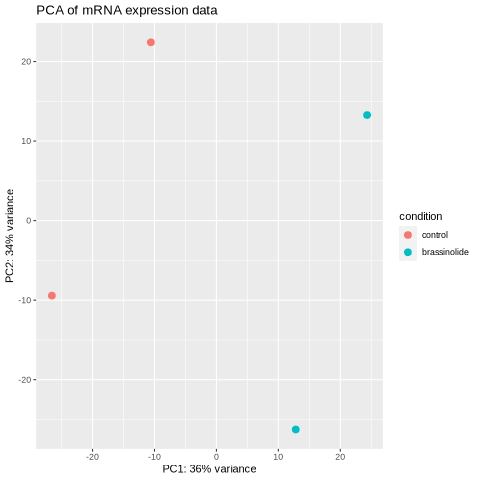

In [243]:
%%R
# PCA plot
rld <- rlog(dds, blind = TRUE)
pcaData <- plotPCA(rld, intgroup = "condition", returnData = TRUE)
percentVar <- round(100 * attr(pcaData, "percentVar"))

ggplot(pcaData, aes(PC1, PC2, color = condition)) +
  geom_point(size = 3) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  ggtitle("PCA of mRNA expression data")

From the information provided by the plot, it is possible to state that there is a better similarity between the samples belonging to the same experimental conditions, since the samples located at opposite ends of the x-axis.

In [244]:
%%R
# Run DESeq2 analysis
dds <- DESeq(dds)
res <- results(dds)


# Apply independent filtering and adjust p-values
res <- lfcShrink(dds, coef="condition_brassinolide_vs_control")

# Save the results sorted by adjusted p-value (padj)
res_sorted <- res[order(res$padj), ]
write.csv(as.data.frame(res_sorted), file = "deseq2_results_sorted.csv")

R[write to console]: using pre-existing size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: -- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing

R[write to console]: using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



You can have a look at  the results table, and you will notice that we obtained a fair amount of DEGs although we started from a reduced dataset. We can also download the results of the analysis as performed on the complete dataset and explore the real differential expression due to brassinolide and create a volcano and MA plot similar to those we created for the differentially expressed miRNAs.

In [151]:
!wget https://zenodo.org/record/4663389/files/mRNA_DESeq2_results_complete_dataset.tabular

--2024-05-18 16:20:41--  https://zenodo.org/record/4663389/files/mRNA_DESeq2_results_complete_dataset.tabular
Resolving zenodo.org (zenodo.org)... 188.184.98.238, 188.185.79.172, 188.184.103.159, ...
Connecting to zenodo.org (zenodo.org)|188.184.98.238|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/4663389/files/mRNA_DESeq2_results_complete_dataset.tabular [following]
--2024-05-18 16:20:41--  https://zenodo.org/records/4663389/files/mRNA_DESeq2_results_complete_dataset.tabular
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 3187318 (3.0M) [application/octet-stream]
Saving to: ‘mRNA_DESeq2_results_complete_dataset.tabular’

mRNA_DESeq2_results 100%[===================>]   3.04M  16.7MB/s    in 0.2s    

2024-05-18 16:20:41 (16.7 MB/s) - ‘mRNA_DESeq2_results_complete_dataset.tabular’ saved [3187318/3187318]



/opt/conda/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

divide by zero encountered in log10



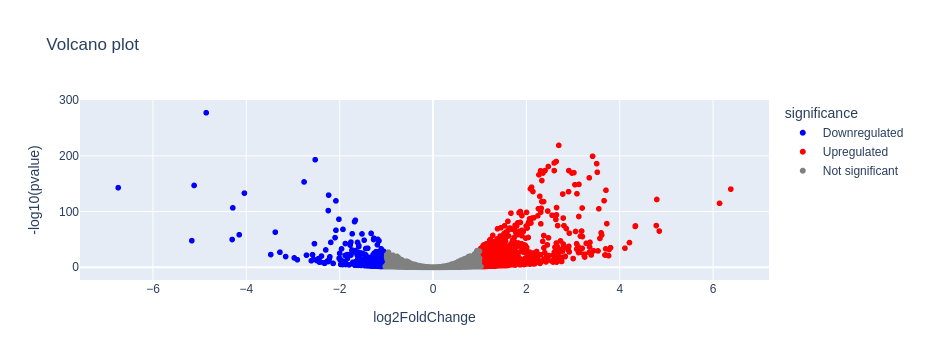

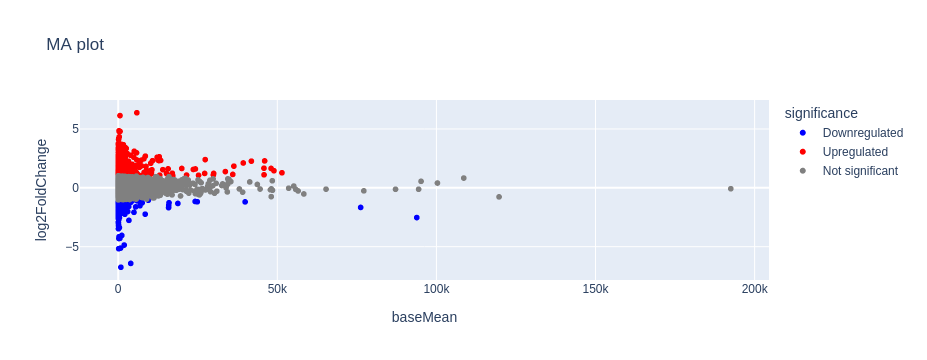

In [154]:
import pandas as pd
import plotly.express as px
import numpy as np
# Read the DESeq2 results
col_names = ["mRNA", "baseMean", "log2FoldChange", "lfcSE", "stat", "pvalue", "padj"]
df = pd.read_csv("mRNA_DESeq2_results_complete_dataset.tabular", names = col_names, sep = "\t")

# Add a column for significance
df['significance'] = 'Not significant'
df.loc[(df['log2FoldChange'] > 1) & (df['padj'] < 0.05), 'significance'] = 'Upregulated'
df.loc[(df['log2FoldChange'] < -1) & (df['padj'] < 0.05), 'significance'] = 'Downregulated'
df['-log10(pvalue)'] = -np.log10(df['padj'])

# Convert to plotly for interactivity
fig_volcano = px.scatter(
    df, x='log2FoldChange', y='-log10(pvalue)', color='significance',
    hover_data=['mRNA'], color_discrete_map={"Not significant": "grey", "Upregulated": "red", "Downregulated": "blue"},
    title="Volcano plot"
)
fig_ma = px.scatter(
    df, x=df['baseMean'], y='log2FoldChange', color='significance',
    hover_data=['mRNA'], color_discrete_map={"Not significant": "grey", "Upregulated": "red", "Downregulated": "blue"},
    title="MA plot"
)

# Show the plots
fig_volcano.show()
fig_ma.show()

In [245]:
df.sort_values(by = "padj").head(10)

,mRNA,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,significance,-log10(pvalue)
0,AT3G30180,3937.638025,-6.418855,0.137765,-46.592778,0.000000e+00,0.000000e+00,Downregulated,inf
1,AT3G50660,1885.009176,-4.859436,0.135384,-35.893750,3.823704e-282,4.058097e-278,Downregulated,277.391678
2,AT5G02020,8532.962223,2.694652,0.084447,31.909379,1.978956e-223,1.400177e-219,Upregulated,218.853817
3,AT4G22590,2268.973723,3.419066,0.112282,30.450584,1.176769e-203,6.244524e-200,Upregulated,199.204501
4,AT4G14130,93826.736037,-2.524120,0.084198,-29.978316,1.881714e-197,7.988252e-194,Downregulated,193.097548
5,AT5G41080,12898.830659,2.640242,0.088828,29.723131,3.858960e-194,1.365171e-190,Upregulated,189.864813
6,AT3G16370,12231.175739,2.596022,0.087956,29.515129,1.841316e-191,5.583395e-188,Upregulated,187.253102
7,AT5G45670,1799.281229,3.506370,0.119214,29.412429,3.808813e-190,1.010573e-186,Upregulated,185.995432
8,AT4G21850,8084.441734,2.470855,0.085186,29.005527,5.604065e-185,1.321688e-181,Upregulated,180.878871
10,AT2G06850,27341.722000,2.399328,0.084446,28.412463,1.418595e-177,2.990378e-174,Upregulated,173.524274


We can briefly head to the [TAIR database](https://www.arabidopsis.org/) to have a look at the functions of some of the most significant DEGs.

# Identification of miRNA targets

To predict which miRNAs target which mRNAs, first we need their transcriptomic sequences in FASTA format. Now we will obtain the sequences of miRNAs whose expression is induced by brassinosteroids and the sequences of mRNAs whose expression is downregulated after treatment with brassinosteroids. 


In [219]:
!zcat Reference_datasets/transcriptome.fasta.gz |sed "s/>,*gene=/>/g; s/\..*$//g" > Reference_datasets/transcriptome.fasta
import pandas as pd
from Bio import SeqIO

def extract_sequences_from_deseq2_results(deseq2_results_file, direction, input_fasta, output_fasta, padj_threshold=0.05, log2fc_threshold=0):
    # Read DESeq2 results
    col_names = ["seqID", "baseMean", "log2FoldChange", "lfcSE", "stat", "pvalue", "padj"]
    res = pd.read_csv(deseq2_results_file, index_col=0, names = col_names, sep = "\t")
    
    # Identify upregulated or downregulated genes
    if direction == "up":
        ids = res[(res['log2FoldChange'] > log2fc_threshold) & (res['padj'] < padj_threshold)].index.tolist()
    elif direction == "down":
        ids = res[(res['log2FoldChange'] < -log2fc_threshold) & (res['padj'] < padj_threshold)].index.tolist()
    else:
        raise ValueError("Direction must be 'up' or 'down'")
    
    # Extract sequences from the input FASTA file
    sequences = []
    for record in SeqIO.parse(input_fasta, "fasta"):
        if record.id in ids:
            sequences.append(record)
    
    # Write sequences to the output FASTA file
    SeqIO.write(sequences, output_fasta, "fasta")
    print(f"Extracted {len(sequences)} sequences to {output_fasta}")


extract_sequences_from_deseq2_results("miRNA_DESeq2_results_complete_dataset.tabular", "up", "Reference_datasets/mature_miRNA_AT.fasta", "mature_upregulated_miRNAs.fasta", log2fc_threshold=0)
extract_sequences_from_deseq2_results("miRNA_DESeq2_results_complete_dataset.tabular", "up", "Reference_datasets/star_miRNA_seq.fasta", "star_miRNA_upregulated.fasta", log2fc_threshold=0)
extract_sequences_from_deseq2_results("mRNA_DESeq2_results_complete_dataset.tabular", "down", "Reference_datasets/transcriptome.fasta", "mRNA_downregulated.fasta", log2fc_threshold=0)

!cat star_miRNA_upregulated.fasta mature_upregulated_miRNAs.fasta > miRNAs_upregulated.fasta


Extracted 9 sequences to mature_upregulated_miRNAs.fasta
Extracted 7 sequences to star_miRNA_upregulated.fasta
Extracted 733 sequences to mRNA_downregulated.fasta


Finally, we can use **TargetFinder** to find putative targets of the induced miRNAs among the downregulated mRNAs. The next two cells do so, but feel free to explore the intermediate files being produced in the process. 

In [220]:
%%bash
targetfinder_threads.pl -f miRNAs_upregulated.fasta -d mRNA_downregulated.fasta -c 5 -t 4 -p table -o targetfinder_output.tsv 2> targetfinder.log 

In [227]:
!cut -f2 targetfinder_output.tsv | sed "/No results/d" | sort | uniq

AT1G69450
AT1G75295
AT2G23330
AT2G33810
AT3G06290
AT4G12750
AT4G18120
AT4G31860
AT5G25560
AT5G27990
AT5G48410


We can now return to TAIR to check all available information for these targets. If you enjoy coding in Python, you can try automatically annotating them using programmatic access to the database.

# Hands-on: comparison of mutants overexpressing brassinosteroid receptor 

It is now your turn to try this kind of analysis on your own! You can try to repeat the workflow by using the sequences stored in the NCBI GEO database with the accession number GSE119382. In that case, you will compare gene expression patterns of mutants overexpressing the brassinosteroid receptor BRL3 under two experimental conditions: control and drought-stress. The required datasets are available in zenodo.

Reads for the drought group:
```
https://zenodo.org/record/4710649/files/SRR7779222_BRL3_mRNA_drought.fastqsanger.gz
https://zenodo.org/record/4710649/files/SRR7779223_BRL3_mRNA_drought.fastqsanger.gz
https://zenodo.org/record/4710649/files/SRR7779224_BRL3_mRNA_drought.fastqsanger.gz
```

and for the watered group
```
https://zenodo.org/record/4710649/files/SRR7779228_BRL3_mRNA_watered.fastqsanger.gz
https://zenodo.org/record/4710649/files/SRR7779229_BRL3_mRNA_watered.fastqsanger.gz
```

here you can find the list of the upregulated miRNAs for the regulatory network analysis (no need of miRNA differential expression analysis)
```
https://zenodo.org/record/4710649/files/upregulated_miRNA_BR_complete_dataset.fasta
```